# Customer Segmentation
## Preparing Data for Customer Segmentation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime, timezone

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

import pickle
import os

In [2]:
df = pd.read_csv('../data/cleaned/customer_data_for_segmentation.csv')

In [3]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,avg_order_value,avg_days_between_orders,order_frequency_per_year,days_since_first_order,days_since_last_order,days_since_registration,days_until_first_order,age_class,registration_year,registration_month
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,46.990002,0.0,3.918697e-16,949.572917,949.572917,1291.572917,342.0,31-40,2020,6
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,65.680000,0.0,1.138093e-14,32.695833,32.695833,100.695833,68.0,19-30,2023,9
2,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,65.000000,0.0,2.779323e-15,133.884722,133.884722,264.884722,131.0,61-70,2023,4
3,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,256.370003,79.0,4.266658e-15,174.426389,95.426389,244.426389,70.0,0-18,2023,5
4,51,2019-07-11 00:19:00+00:00,66,M,Siegen,Germany,2021-08-15 00:19:00+00:00,2021-08-15 00:19:00+00:00,1,1.0,...,120.000000,0.0,4.282100e-16,868.986806,868.986806,1634.986806,766.0,61-70,2019,7


In [4]:
df.shape

(13074, 21)

The dataframe already contains all columns needed to create the RFM model.
Let's select them:

In [5]:
rfm_df = df[['user_id', 'days_since_last_order', 'total_orders', 'total_revenue']]
rfm_df.columns = ['user_id', 'recency', 'frequency', 'monetary']

In [6]:
rfm_df.head()

,user_id,recency,frequency,monetary
0,18,949.572917,1,46.990002
1,29,32.695833,1,65.680000
2,49,133.884722,1,65.000000
3,50,95.426389,2,512.740005
4,51,868.986806,1,120.000000


In [7]:
rfm_df.describe()

,user_id,recency,frequency,monetary
count,13074.000000,13074.000000,13074.00000,13074.000000
mean,50017.672786,330.397627,1.56425,280.737714
std,28766.954345,285.947957,0.85365,422.750683
min,18.000000,0.213889,1.00000,0.490000
25%,25104.500000,89.517535,1.00000,44.950001
50%,49724.000000,247.436111,1.00000,118.990000
75%,75054.750000,512.170139,2.00000,318.539999
max,99999.000000,1094.945139,4.00000,3954.280006


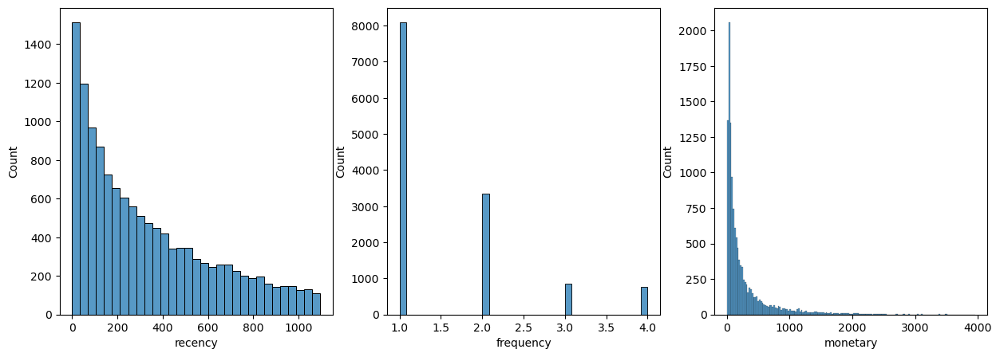

In [8]:
# The variables shouldn't be skewed and should have the same mean and variance. Let's check:

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

The monetary and recency variables are skewed while frequency is an ordinal variable.
- Right-skewed recency: Most customers have made recent purchases, and there is a long tail of customers who haven't made purchases for a longer time. Remember, before the customers that haven't purchased anything in 3 years were already filtered out.

- Right-skewed monetary: Most customers have lower monetary values, and there is a long tail of customers with some higher monetary values.

- Low frequency: Most customers are one time purchasers. Maximum of purchase counts is 4.

In the next step, the data will be transformed. It's checked if yeo-johnson or box-cox transformation works best to transform the variables.

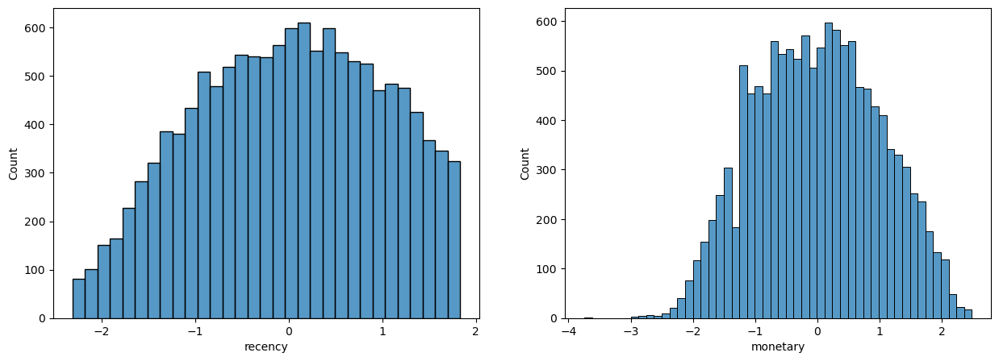

Skew of recency is:  -0.13
Skew of monetary is:  0.01


In [9]:
# transforming frequency doesn't make sense because it's ordinal
to_be_transformed_df1 = rfm_df[['recency', 'monetary']]

# First checking how the distribution looks like with method yeo-johnson
transformer1 = PowerTransformer(method='yeo-johnson')
transformed1 = transformer1.fit_transform(to_be_transformed_df1)

transformed_df1 = pd.DataFrame(transformed1, columns=to_be_transformed_df1.columns)

fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df1, x='recency', ax=ax[0])
sns.histplot(transformed_df1, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df1['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df1['monetary'].skew().round(2))

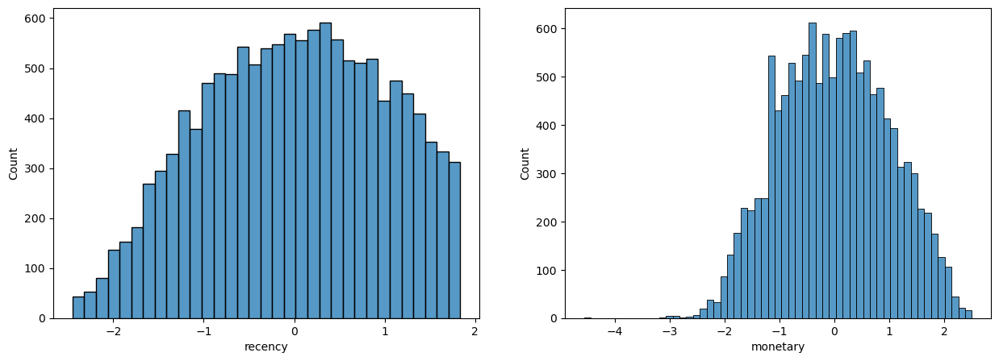

Skew of recency is:  -0.14
Skew of monetary is:  0.01


In [10]:
# testing the transformation with box-cox as well

to_be_transformed_df2 = rfm_df[['recency', 'monetary']]
transformer2 = PowerTransformer(method='box-cox')
transformed2 = transformer2.fit_transform(to_be_transformed_df2)
transformed_df2 = pd.DataFrame(transformed2, columns=to_be_transformed_df2.columns)

path = '../transformers/'
filename = "r_m_boxcox.pkl" 
with open(path+filename, "wb") as file:
    pickle.dump(transformer2,file)
        
        
fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df2, x='recency', ax=ax[0])
sns.histplot(transformed_df2, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df2['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df2['monetary'].skew().round(2))

In [11]:
# the transformers perform very simlar. lets continue with the box-cox transformation
transformed_df2.describe()

,recency,monetary
count,1.307400e+04,1.307400e+04
mean,-2.331519e-16,4.298909e-16
std,1.000038e+00,1.000038e+00
min,-2.451246e+00,-4.559700e+00
25%,-7.689404e-01,-7.436438e-01
50%,3.135013e-02,5.179182e-03
75%,8.008082e-01,7.380831e-01
max,1.837052e+00,2.505923e+00


In [12]:
transformed_df2 = pd.concat([rfm_df['frequency'],transformed_df2[['recency', 'monetary']]], axis=1)

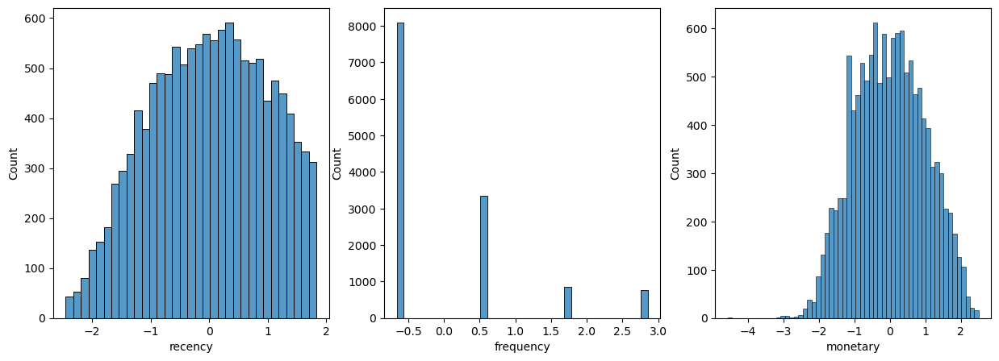

In [13]:
scaler = StandardScaler()

scaled = scaler.fit_transform(transformed_df2)
scaled_df = pd.DataFrame(scaled, columns=transformed_df2.columns)

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(scaled_df, x='recency', ax=ax[0])
sns.histplot(scaled_df, x='frequency', ax=ax[1])
sns.histplot(scaled_df, x='monetary', ax=ax[2])
plt.show()


In [14]:
scaled_df.describe()

,frequency,recency,monetary
count,1.307400e+04,1.307400e+04,1.307400e+04
mean,-2.880432e-17,-2.717388e-18,-8.695643e-18
std,1.000038e+00,1.000038e+00,1.000038e+00
min,-6.610102e-01,-2.451246e+00,-4.559700e+00
25%,-6.610102e-01,-7.689404e-01,-7.436438e-01
50%,-6.610102e-01,3.135013e-02,5.179182e-03
75%,5.104751e-01,8.008082e-01,7.380831e-01
max,2.853446e+00,1.837052e+00,2.505923e+00


In [15]:
print(scaled_df.mean(axis = 0).round(2)) 
print(scaled_df.std(axis = 0).round(2)) 

frequency   -0.0
recency     -0.0
monetary    -0.0
dtype: float64
frequency    1.0
recency      1.0
monetary     1.0
dtype: float64


## Applying RFM Scoring Model

In [16]:
# RFM has 4 clusters in each category
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['recency']])
scaled_df['recency_cluster'] = kmeans.predict(scaled_df[['recency']])

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [17]:
# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['recency']], scaled_df['recency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.5478254869979323


In [18]:
def order_cluster(clusters: str, score: str, df: pd.DataFrame, ascending):
    """
    Takes the generated clusters, orders them and assigns them to the final cluster score.
    """
    
    # Calculate mean frequency for each cluster
    mean_frequency_per_cluster = df.groupby(clusters)[score].mean()

    # Order clusters based on mean frequency
    ordered_clusters = mean_frequency_per_cluster.sort_values(ascending=ascending).index

    # Map the original cluster labels to the ordered clusters
    df['frequency_cluster'] = df[clusters].map(dict(zip(ordered_clusters, range(len(ordered_clusters)))))

    return df[['frequency_cluster']]

In [19]:
rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/2912497725.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)


In [20]:
rfm_df['recency_cluster'].value_counts()

recency_cluster
1    3913
2    3658
0    3126
3    2377
Name: count, dtype: int64

In [21]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['frequency']])
scaled_df['frequency_cluster'] = kmeans.predict(scaled_df[['frequency']])

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['frequency']], scaled_df['frequency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score: 1.0


In [22]:
rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/2337404798.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)


In [23]:
rfm_df['frequency_cluster'].value_counts()

frequency_cluster
0    8089
1    3357
2     864
3     764
Name: count, dtype: int64

In [24]:
# Again, we need to split in 4 clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['monetary']])
scaled_df['monetary_cluster'] = kmeans.predict(scaled_df[['monetary']])
rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['monetary']], scaled_df['monetary_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/1955502200.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)


Silhouette Score: 0.5380037691427981


In [25]:
rfm_df['monetary_cluster'].value_counts()

monetary_cluster
2    3987
1    3913
0    2689
3    2485
Name: count, dtype: int64

In [26]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,13074.0,50017.672786,28766.954345,18.000000,25104.500000,49724.000000,75054.750000,99999.000000
recency,13074.0,330.397627,285.947957,0.213889,89.517535,247.436111,512.170139,1094.945139
frequency,13074.0,1.564250,0.853650,1.000000,1.000000,1.000000,2.000000,4.000000
monetary,13074.0,280.737714,422.750683,0.490000,44.950001,118.990000,318.539999,3954.280006
recency_cluster,13074.0,1.404314,1.040553,0.000000,1.000000,1.000000,2.000000,3.000000
frequency_cluster,13074.0,0.564250,0.853650,0.000000,0.000000,0.000000,1.000000,3.000000
monetary_cluster,13074.0,1.479425,1.020368,0.000000,1.000000,1.000000,2.000000,3.000000


In [27]:
rfm_df.groupby('recency_cluster')['recency'].describe()

,count,mean,std,min,25%,50%,75%,max
recency_cluster,,,,,,,,
0,3126.0,763.265276,159.225369,525.344444,628.327431,738.621181,887.404340,1094.945139
1,3913.0,354.715113,88.161868,218.545833,278.524306,346.755556,425.756250,525.265972
2,3658.0,131.061055,45.652370,60.614583,90.595660,126.659722,168.797049,218.440972
3,2377.0,27.862744,17.374601,0.213889,13.229167,26.768056,42.271528,60.556250


In [28]:
rfm_df.groupby('frequency_cluster')['frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
frequency_cluster,,,,,,,,
0,8089.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
1,3357.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0
2,864.0,3.0,0.0,3.0,3.0,3.0,3.0,3.0
3,764.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0


In [29]:
rfm_df.groupby('monetary_cluster')['monetary'].describe()

,count,mean,std,min,25%,50%,75%,max
monetary_cluster,,,,,,,,
0,2689.0,22.113518,8.348509,0.490000,14.990000,23.000000,29.410000,36.500000
1,3913.0,70.888727,23.620460,36.599998,49.990002,67.990002,89.949997,120.000000
2,3987.0,233.239343,84.633705,120.280001,160.000000,215.000000,294.870001,426.000000
3,2485.0,967.238942,557.900561,426.379997,559.919998,782.880028,1181.480003,3954.280006


In [30]:
#overall scoring
rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']
#rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['monetary_cluster']

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/715130164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']


In [31]:
rfm_df.groupby('total_score')[['recency', 'frequency', 'monetary']].mean()
#rfm_df.groupby('total_score')[['recency', 'monetary']].mean()

,recency,frequency,monetary
total_score,,,
0,774.081080,1.000000,21.899703
1,578.946425,1.000531,47.081714
2,399.025968,1.035482,85.052480
3,286.813925,1.209615,128.905591
4,234.325721,1.496316,220.396879
5,182.296638,1.837079,362.652620
6,156.182774,2.334583,558.036486
7,150.906576,3.003012,960.362380
8,84.643179,3.590726,1191.528106


In [32]:
rfm_scores_only = rfm_df[['total_score']]
rfm_scores_only.head()

,total_score
0,1
1,4
2,3
3,6
4,1


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 25934.0.
Iteration 1, inertia 19315.938445779822.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 32981.0.
Iteration 1, inertia 20065.83580133987.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 33843.0.
Iteration 1, inertia 24348.3665130961.
Iteration 2, inertia 19315.938445779822.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 21001.0.
Iteration 1, inertia 19315.938445779822.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 33843.0.
Iteration 1, inertia 24348.3665130961.
Iteration 2, inertia 19315.938445779822.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 25833.0.
Iteration 1, inertia 24348.3665130961.
Iteration 2, inertia 19315.938445779822.
Converged at iteration 2: strict converg

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 11995.0.
Iteration 1, inertia 8661.875659305653.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 10998.0.
Iteration 1, inertia 9493.055795384442.
Converged at iteration 1: strict convergence.
Training a K-Means model with 4 clusters! 

Initialization complete
Iteration 0, inertia 7727.0.
Iteration 1, inertia 5761.537066848257.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 9096.0.
Iteration 1, inertia 7392.268073015068.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 7786.0.
Iteration 1, inertia 5045.141209379515.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 8504.0.
Iteration 1, inertia 4936.089056946382.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 7318.0.
Iteration 1, inertia 5761.537066848257.
Converged at iteration 1: strict convergence.
Initi

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 5 clusters! 

Initialization complete
Iteration 0, inertia 5416.0.
Iteration 1, inertia 3660.74934447914.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4650.0.
Iteration 1, inertia 2944.353487010469.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5416.0.
Iteration 1, inertia 3660.74934447914.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5418.0.
Iteration 1, inertia 4002.8271205223973.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4650.0.
Iteration 1, inertia 2944.353487010469.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 6144.0.
Iteration 1, inertia 5996.097970381397.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 6777.0.
Iteration 1, inertia 3660.74934447914.
Converged at iteration 1: stric

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 6 clusters! 

Initialization complete
Iteration 0, inertia 3992.0.
Iteration 1, inertia 2165.117879106022.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4295.0.
Iteration 1, inertia 2967.1301879574403.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3510.0.
Iteration 1, inertia 1936.7628756880117.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2750.0.
Iteration 1, inertia 1902.0393981532434.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3107.0.
Iteration 1, inertia 1902.0393981532434.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4252.0.
Iteration 1, inertia 2379.3635204552656.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3994.0.
Iteration 1, inertia 3392.868067933041.
Converged at iteration 1

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 2750.0.
Iteration 1, inertia 1902.0393981532434.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3827.0.
Iteration 1, inertia 1902.0393981532434.
Converged at iteration 1: strict convergence.
Training a K-Means model with 7 clusters! 

Initialization complete
Iteration 0, inertia 1683.0.
Iteration 1, inertia 1122.8037902487804.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2151.0.
Iteration 1, inertia 1292.080345563954.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1967.0.
Iteration 1, inertia 1122.8037902487804.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2727.0.
Iteration 1, inertia 1323.4687931558278.
Converged at iteration 1: strict convergence.
Initialization complete


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 2584.0.
Iteration 1, inertia 2053.4452890667126.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2584.0.
Iteration 1, inertia 2053.4452890667126.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1943.0.
Iteration 1, inertia 1337.0494315980436.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2411.0.
Iteration 1, inertia 2402.1402214021973.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1683.0.
Iteration 1, inertia 1122.8037902487804.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2300.0.
Iteration 1, inertia 2053.4452890667126.
Converged at iteration 1: strict convergence.
Training a K-Means model with 8 clusters! 

Initialization complete
Iteration 0, inertia 876.0.
Iteration 1, inertia 557.8138236935663.
Converged at iteration 1: strict convergence.
In

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 1019.0.
Iteration 1, inertia 713.5097405664992.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 876.0.
Iteration 1, inertia 557.8138236935663.
Converged at iteration 1: strict convergence.
Training a K-Means model with 9 clusters! 

Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 212.0.
Iteration 1, inertia 148.5197740113005.
Converged at iteration 1: strict convergence.


Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

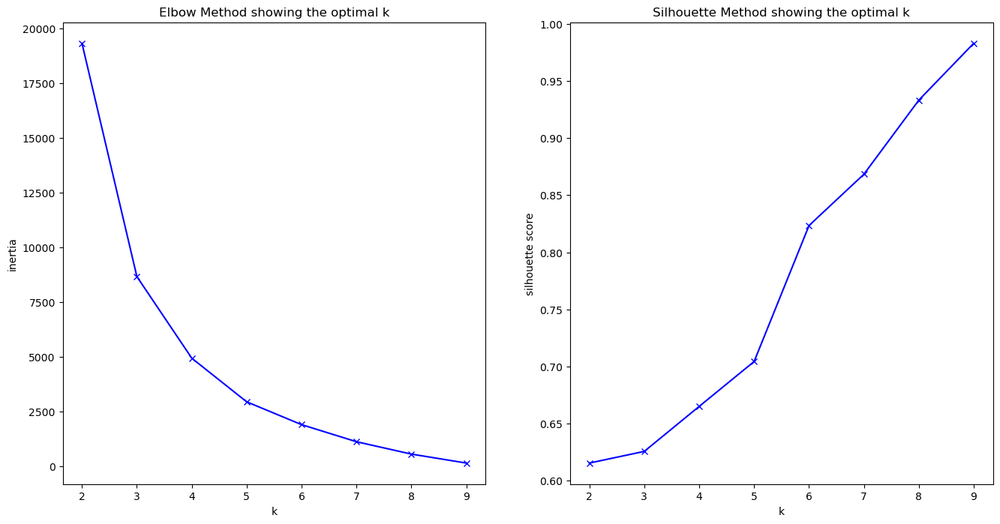

In [33]:
# We have a maximum total score of 9. Let's figure out how many clusters are optimal to segment the customers based on the scoring.

K = range(2, 10) #max 9 clusters

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(rfm_scores_only)
    
    path = '../models/'
    filename = "kmeans_rfm_scores_" + str(k) + ".pkl" 
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(rfm_scores_only, kmeans.predict(rfm_scores_only)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [34]:
def load(filename = "filename.pkl"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [35]:
# optimal k between 3-5. silhouette score improving as k increases
# unclear which k to choose
# appyling according to business knowledge and choosing k:
best_model_scoring = load("../models/kmeans_rfm_scores_3.pkl")

In [36]:
rfm_copy = rfm_df.copy()
rfm_copy['kmeans_total_scores_n3'] = best_model_scoring.predict(rfm_scores_only)
rfm_copy

,user_id,recency,frequency,monetary,recency_cluster,frequency_cluster,monetary_cluster,total_score,kmeans_total_scores_n3
0,18,949.572917,1,46.990002,0,0,1,1,1
1,29,32.695833,1,65.680000,3,0,1,4,0
2,49,133.884722,1,65.000000,2,0,1,3,0
3,50,95.426389,2,512.740005,2,1,3,6,2
4,51,868.986806,1,120.000000,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...
13069,99951,686.563889,1,46.000000,0,0,1,1,1
13070,99962,344.352778,3,347.940004,1,2,2,5,0
13071,99982,727.484028,2,383.900002,0,1,2,3,0
13072,99997,63.479167,1,12.950000,2,0,0,2,1


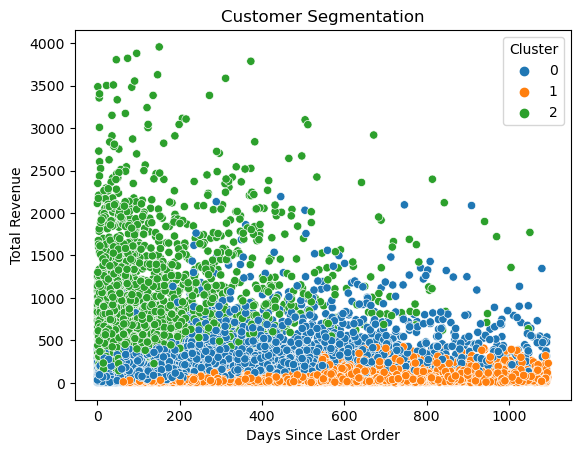

Silhouette Score: -0.006137144948949331
Calinski_harabasz Score: 2.1974969954410057


In [37]:
sns.scatterplot(x='recency', y='monetary', data=rfm_copy, hue='kmeans_total_scores_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

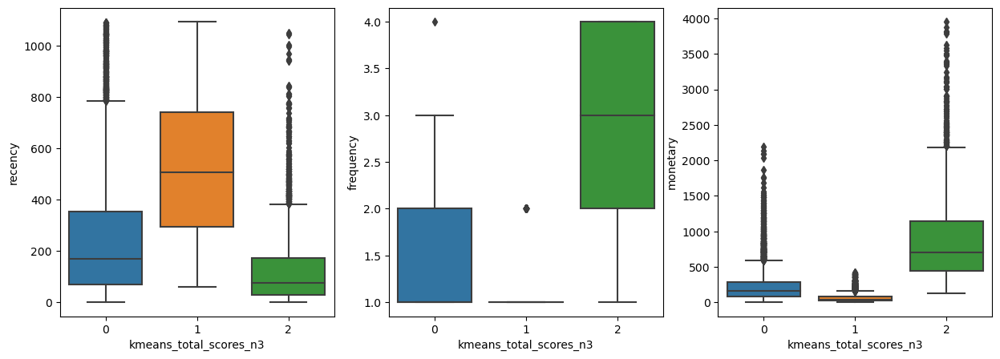

In [38]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='recency', ax=ax[0])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='frequency', ax=ax[1])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='monetary', ax=ax[2])
plt.show()

- Group 0: mostly purchased in last year, once or twice buyers, low spendings (with long tail)
- Group 1: last purchase some time ago, purchased once, lowest spendings
- Group 2: more recenct buyers (long tail), purchased usually more than once, middle spendings

## Clustering customers without RFM scoring model - Applying Transforming and Scaling

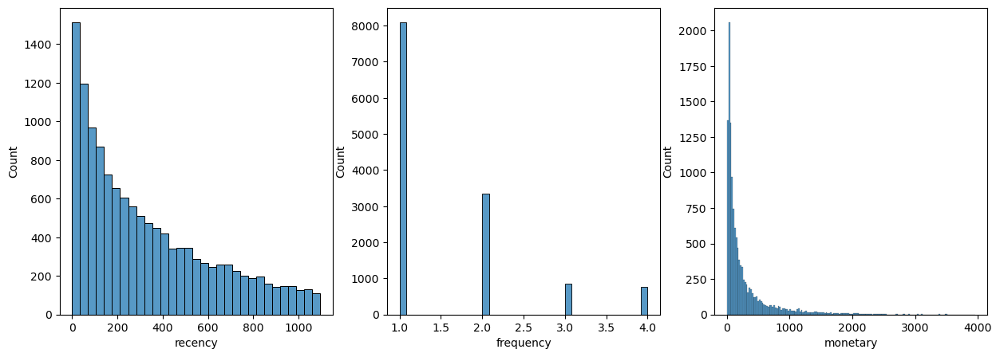

In [39]:
# only have chosen 2 features - the total_orders should have been added too
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

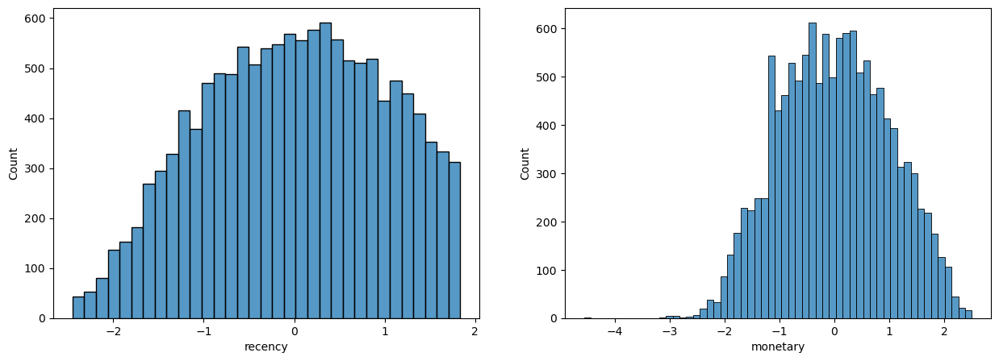

Skew of recency is:  -0.14
Skew of monetary is:  0.01


In [40]:
# Log-transform 'recency' and 'monetary'
# Box Cox as performed before

#to_be_transformed_df = rfm_df[['recency', 'monetary']]
#transformer = PowerTransformer(method='box-cox')
#transformed = transformer.fit_transform(to_be_transformed_df)
#transformed_df = pd.DataFrame(transformed, columns=to_be_transformed_df.columns)

fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df2, x='recency', ax=ax[0])
sns.histplot(transformed_df2, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df2['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df2['monetary'].skew().round(2))


In [41]:
# add frequency again
transformed_df = pd.concat([rfm_df['frequency'],transformed_df2[['recency', 'monetary']]], axis=1)

In [42]:
# next standardize all three
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(transformed_df)
scaled = scaler.transform(transformed_df)

path = "../scalers/"
filename = "scaler_after_transf.pkl"
# Check whether the specified path exists or not
isExist = os.path.exists(path)
if not isExist:
    # Create a new directory because it does not exist
    os.makedirs(path)
    print("The new directory is created!")
    
with open(path + filename, "wb") as file:
    pickle.dump(scaler, file)

scaled_df = pd.DataFrame(scaled, columns = transformed_df.columns)
display(scaled_df.head())

,frequency,recency,monetary
0,-0.661010,1.621760,-0.708966
1,-0.661010,-1.329998,-0.449003
2,-0.661010,-0.484840,-0.457039
3,0.510475,-0.726395,1.083765
4,-0.661010,1.492920,0.011574


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 42920.97168639283.
Iteration 1, inertia 28698.857376904904.
Iteration 2, inertia 26662.632541901607.
Iteration 3, inertia 25027.60115003594.
Iteration 4, inertia 23848.448345770743.
Iteration 5, inertia 23065.00704322868.
Iteration 6, inertia 22663.25454379188.
Iteration 7, inertia 22533.659683432135.
Iteration 8, inertia 22505.892697292995.
Iteration 9, inertia 22502.102073068956.
Converged at iteration 9: center shift 3.912225130962887e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 30491.035898253453.
Iteration 1, inertia 24652.54670806791.
Iteration 2, inertia 23686.317327314166.
Iteration 3, inertia 22968.356072553168.
Iteration 4, inertia 22684.964215873842.
Iteration 5, inertia 22574.33434292541.
Iteration 6, inertia 22528.133069575102.
Iteration 7, inertia 22510.06844553457.
Iteration 8, inertia 22503.5775166307.
Iteration 9, inertia 22501.954698341

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 3 clusters! 

Initialization complete
Iteration 0, inertia 24454.421922891906.
Iteration 1, inertia 16493.47325754589.
Iteration 2, inertia 16367.4260309922.
Iteration 3, inertia 16321.326304275863.
Iteration 4, inertia 16297.81162904207.
Iteration 5, inertia 16287.014425060152.
Iteration 6, inertia 16280.44751613402.
Iteration 7, inertia 16277.116565090933.
Iteration 8, inertia 16273.863808692371.
Iteration 9, inertia 16270.967118777493.
Iteration 10, inertia 16268.840528982204.
Iteration 11, inertia 16267.428085347652.
Iteration 12, inertia 16266.580975570561.
Converged at iteration 12: center shift 4.758176957126734e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 21229.528665165428.
Iteration 1, inertia 16711.74874647145.
Iteration 2, inertia 16533.60515194558.
Iteration 3, inertia 16440.871358793123.
Iteration 4, inertia 16385.768412979625.
Iteration 5, inertia 16343.591741723314.
Iteration 6, inertia 16315.419

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 11, inertia 16482.665265558753.
Iteration 12, inertia 16413.62112564708.
Iteration 13, inertia 16358.969659932895.
Iteration 14, inertia 16320.674844940433.
Iteration 15, inertia 16297.88307094161.
Iteration 16, inertia 16286.84258859478.
Iteration 17, inertia 16280.528673303095.
Iteration 18, inertia 16277.204565255935.
Iteration 19, inertia 16273.802602092128.
Iteration 20, inertia 16270.632966374913.
Iteration 21, inertia 16268.60519113695.
Iteration 22, inertia 16267.255733592232.
Iteration 23, inertia 16266.549868615552.
Converged at iteration 23: center shift 4.077387206070749e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 27814.921226857146.
Iteration 1, inertia 17072.33374528274.
Iteration 2, inertia 16458.981556561404.
Iteration 3, inertia 16329.008450493602.
Iteration 4, inertia 16294.481919848655.
Iteration 5, inertia 16281.977072215159.
Iteration 6, inertia 16274.404888571727.
Iteration 7, inertia 16269.268889221941.
Iter

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 4, inertia 12894.615508256393.
Iteration 5, inertia 12813.254465419363.
Iteration 6, inertia 12777.551598765856.
Iteration 7, inertia 12757.835813802632.
Iteration 8, inertia 12741.344924240984.
Iteration 9, inertia 12724.531935492792.
Iteration 10, inertia 12711.60183386374.
Iteration 11, inertia 12700.391584522085.
Iteration 12, inertia 12691.121545329903.
Iteration 13, inertia 12682.405026180812.
Iteration 14, inertia 12675.549124925341.
Iteration 15, inertia 12671.539451477176.
Iteration 16, inertia 12668.337746209454.
Iteration 17, inertia 12664.78102443184.
Iteration 18, inertia 12660.412871040766.
Iteration 19, inertia 12655.843302285877.
Iteration 20, inertia 12651.957418832793.
Iteration 21, inertia 12649.213904670529.
Iteration 22, inertia 12645.246040627944.
Iteration 23, inertia 12640.315972919767.
Iteration 24, inertia 12634.332314669542.
Iteration 25, inertia 12628.699466067825.
Iteration 26, inertia 12622.005681960496.
Iteration 27, inertia 12615.436114638098.


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 14463.109785009992.
Iteration 1, inertia 11722.140312282834.
Iteration 2, inertia 11272.58115276119.
Iteration 3, inertia 11005.866598856805.
Iteration 4, inertia 10724.597684452925.
Iteration 5, inertia 10484.098589656693.
Iteration 6, inertia 10345.575591662759.
Iteration 7, inertia 10275.241147706804.
Iteration 8, inertia 10230.805233371138.
Iteration 9, inertia 10200.489681448162.
Iteration 10, inertia 10181.395747451688.
Iteration 11, inertia 10167.056534859123.
Iteration 12, inertia 10157.466065087305.
Iteration 13, inertia 10150.40141597453.
Iteration 14, inertia 10142.817155730276.
Iteration 15, inertia 10135.230684440288.
Iteration 16, inertia 10128.647266843116.
Iteration 17, inertia 10122.909382845035.
Iteration 18, inertia 10119.030019310952.
Iteration 19, inertia 10115.05677378798.
Iteration 20, inertia 10110.99777371712.
Iteration 21, inertia 10106.700936506117.
Iteration 22, inertia 10100.056422463658.
Iteration 23, inertia 10

Training a K-Means model with 6 clusters! 

Initialization complete
Iteration 0, inertia 12253.737724012884.
Iteration 1, inertia 10250.80314834914.
Iteration 2, inertia 10032.865212554547.
Iteration 3, inertia 9965.353020213843.
Iteration 4, inertia 9891.679419424256.
Iteration 5, inertia 9731.503467191687.
Iteration 6, inertia 9474.643477800017.
Iteration 7, inertia 9218.951534709377.
Iteration 8, inertia 9046.161542377293.
Iteration 9, inertia 8947.754659701339.
Iteration 10, inertia 8891.231409161483.
Iteration 11, inertia 8843.66084457433.
Iteration 12, inertia 8807.073636774345.
Iteration 13, inertia 8781.726666395338.
Iteration 14, inertia 8756.759584716703.
Iteration 15, inertia 8729.470973269355.
Iteration 16, inertia 8701.380756131297.
Iteration 17, inertia 8679.57774341666.
Iteration 18, inertia 8663.558102512277.
Iteration 19, inertia 8650.954897860604.
Iteration 20, inertia 8640.779874796284.
Iteration 21, inertia 8633.04834561143.
Iteration 22, inertia 8626.491121846211.


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 2, inertia 9545.250994168695.
Iteration 3, inertia 9252.672396863516.
Iteration 4, inertia 9124.332542833958.
Iteration 5, inertia 9055.076007366531.
Iteration 6, inertia 9007.99275981191.
Iteration 7, inertia 8972.23880858596.
Iteration 8, inertia 8942.703951498013.
Iteration 9, inertia 8922.072551730089.
Iteration 10, inertia 8906.312500006992.
Iteration 11, inertia 8895.28915241684.
Iteration 12, inertia 8884.536134145543.
Iteration 13, inertia 8873.542589170669.
Iteration 14, inertia 8865.135333834154.
Iteration 15, inertia 8857.317446268884.
Iteration 16, inertia 8847.173670568409.
Iteration 17, inertia 8834.33957402514.
Iteration 18, inertia 8820.049494443225.
Iteration 19, inertia 8805.753924763347.
Iteration 20, inertia 8786.595845996982.
Iteration 21, inertia 8752.213382810529.
Iteration 22, inertia 8703.675031428455.
Iteration 23, inertia 8663.995351505047.
Iteration 24, inertia 8636.75942421837.
Iteration 25, inertia 8618.197101405916.
Iteration 26, inertia 8609.10

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 10930.063091247168.
Iteration 1, inertia 8585.462666651925.
Iteration 2, inertia 8436.148280429226.
Iteration 3, inertia 8395.249969159646.
Iteration 4, inertia 8379.725623186685.
Iteration 5, inertia 8373.362689708072.
Iteration 6, inertia 8369.466781503981.
Iteration 7, inertia 8367.923408012233.
Iteration 8, inertia 8366.852466203247.
Iteration 9, inertia 8366.100230953205.
Iteration 10, inertia 8365.587677381809.
Converged at iteration 10: center shift 6.891805459778802e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 11550.24105506864.
Iteration 1, inertia 8838.43411159197.
Iteration 2, inertia 8221.042533336222.
Iteration 3, inertia 7906.199920503452.
Iteration 4, inertia 7766.716096160386.
Iteration 5, inertia 7707.323041927589.
Iteration 6, inertia 7684.779767230841.
Iteration 7, inertia 7679.238363927045.
Iteration 8, inertia 7677.001942451185.
Iteration 9, inertia 7674.532554269333.
Iteratio

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 8929.750920510138.
Iteration 1, inertia 7354.617874148178.
Iteration 2, inertia 7088.000458980327.
Iteration 3, inertia 6983.286915916982.
Iteration 4, inertia 6924.825554587377.
Iteration 5, inertia 6893.6790355038775.
Iteration 6, inertia 6878.13110568418.
Iteration 7, inertia 6869.576182186989.
Iteration 8, inertia 6865.089051779196.
Iteration 9, inertia 6862.280666867639.
Iteration 10, inertia 6860.218920352478.
Iteration 11, inertia 6858.777960095773.
Iteration 12, inertia 6857.794981302192.
Iteration 13, inertia 6856.529839413659.
Iteration 14, inertia 6855.302451595908.
Iteration 15, inertia 6854.3390440469975.
Iteration 16, inertia 6853.595945516585.
Iteration 17, inertia 6852.910483161884.
Iteration 18, inertia 6851.893802051326.
Iteration 19, inertia 6850.999019468709.
Iteration 20, inertia 6850.06720375254.
Iteration 21, inertia 6849.277466467862.
Iteration 22, inertia 6848.837997983783.
Converged at iteration 22: center shift 7.1

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 4, inertia 6196.366988290674.
Iteration 5, inertia 6166.799566691918.
Iteration 6, inertia 6150.125647824352.
Iteration 7, inertia 6141.532689315113.
Iteration 8, inertia 6137.438118556674.
Iteration 9, inertia 6135.334071066667.
Iteration 10, inertia 6133.77351560591.
Iteration 11, inertia 6132.451964280308.
Iteration 12, inertia 6131.119516108962.
Iteration 13, inertia 6129.859682491044.
Iteration 14, inertia 6128.930374504914.
Iteration 15, inertia 6128.220417280143.
Iteration 16, inertia 6127.750125593748.
Iteration 17, inertia 6127.379467741199.
Converged at iteration 17: center shift 6.189330168836099e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 9549.885105086083.
Iteration 1, inertia 6962.9753933257325.
Iteration 2, inertia 6757.789106024209.
Iteration 3, inertia 6693.399673296364.
Iteration 4, inertia 6656.809796102717.
Iteration 5, inertia 6630.821244747708.
Iteration 6, inertia 6605.017218650865.
Iteration 7, inertia 6576

Iteration 28, inertia 6317.175373624519.
Iteration 29, inertia 6316.078354010106.
Iteration 30, inertia 6314.669492813449.
Iteration 31, inertia 6313.314803593257.
Iteration 32, inertia 6312.217923012221.
Iteration 33, inertia 6311.121765045036.
Iteration 34, inertia 6310.194059448312.
Iteration 35, inertia 6309.1066413965.
Iteration 36, inertia 6307.852501293475.
Iteration 37, inertia 6306.778940876903.
Iteration 38, inertia 6305.853449312835.
Iteration 39, inertia 6305.444705710868.
Converged at iteration 39: center shift 7.903915355455555e-05 within tolerance 0.00010000000000000391.
Training a K-Means model with 10 clusters! 

Initialization complete
Iteration 0, inertia 7117.985774028667.
Iteration 1, inertia 6228.12051726931.
Iteration 2, inertia 6119.37165406727.
Iteration 3, inertia 6079.415621212789.
Iteration 4, inertia 6060.272637179073.
Iteration 5, inertia 6050.765628596955.
Iteration 6, inertia 6044.7985108067405.
Iteration 7, inertia 6041.463114804119.
Iteration 8, inerti

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 5, inertia 6287.373379119648.
Iteration 6, inertia 6225.549982549555.
Iteration 7, inertia 6179.6796143785705.
Iteration 8, inertia 6147.918935346081.
Iteration 9, inertia 6123.445127253044.
Iteration 10, inertia 6108.464794242612.
Iteration 11, inertia 6098.5185937062015.
Iteration 12, inertia 6092.202817123396.
Iteration 13, inertia 6088.785950212206.
Iteration 14, inertia 6086.666242552508.
Iteration 15, inertia 6085.298375887114.
Iteration 16, inertia 6084.29121431026.
Iteration 17, inertia 6083.821141938859.
Iteration 18, inertia 6083.47534029716.
Converged at iteration 18: center shift 5.946506211202044e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 7335.862962210827.
Iteration 1, inertia 5969.862499330711.
Iteration 2, inertia 5746.846778800338.
Iteration 3, inertia 5684.205508870653.
Iteration 4, inertia 5667.398081982983.
Iteration 5, inertia 5661.9369193492585.
Iteration 6, inertia 5660.03379510882.
Iteration 7, inertia 565

Iteration 14, inertia 6070.852509848759.
Iteration 15, inertia 6015.766457569538.
Iteration 16, inertia 5950.616762571717.
Iteration 17, inertia 5883.840632711487.
Iteration 18, inertia 5829.060825433888.
Iteration 19, inertia 5787.391453427988.
Iteration 20, inertia 5764.547235072907.
Iteration 21, inertia 5755.6388840991185.
Iteration 22, inertia 5751.081042653931.
Iteration 23, inertia 5748.253858573002.
Iteration 24, inertia 5746.039724969598.
Iteration 25, inertia 5745.020630806783.
Iteration 26, inertia 5744.533737762365.
Iteration 27, inertia 5744.229145805343.
Converged at iteration 27: center shift 4.045231445969117e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 7312.828445188272.
Iteration 1, inertia 6005.0536419242.
Iteration 2, inertia 5744.374024777833.
Iteration 3, inertia 5685.399006420879.
Iteration 4, inertia 5669.226343086339.
Iteration 5, inertia 5660.935491451526.
Iteration 6, inertia 5655.211555960412.
Iteration 7, inertia

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 7132.197066132849.
Iteration 1, inertia 5782.859228665525.
Iteration 2, inertia 5561.222368070317.
Iteration 3, inertia 5469.738889693838.
Iteration 4, inertia 5415.285353428162.
Iteration 5, inertia 5383.409845976149.
Iteration 6, inertia 5364.186549613794.
Iteration 7, inertia 5352.050585945629.
Iteration 8, inertia 5346.432306487188.
Iteration 9, inertia 5342.730618789203.
Iteration 10, inertia 5340.20815279791.
Iteration 11, inertia 5337.83888977314.
Iteration 12, inertia 5336.427726797253.
Iteration 13, inertia 5335.513182561277.
Iteration 14, inertia 5335.06551242891.
Iteration 15, inertia 5334.69678175751.
Converged at iteration 15: center shift 9.748041412567125e-05 within tolerance 0.00010000000000000391.
Initialization complete
Iteration 0, inertia 6971.557123983866.
Iteration 1, inertia 5535.239670900084.
Iteration 2, inertia 5374.642699849484.
Iteration 3, inertia 5295.490900940344.
Iteration 4, inertia 5256.154688588733.
Iterati

Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

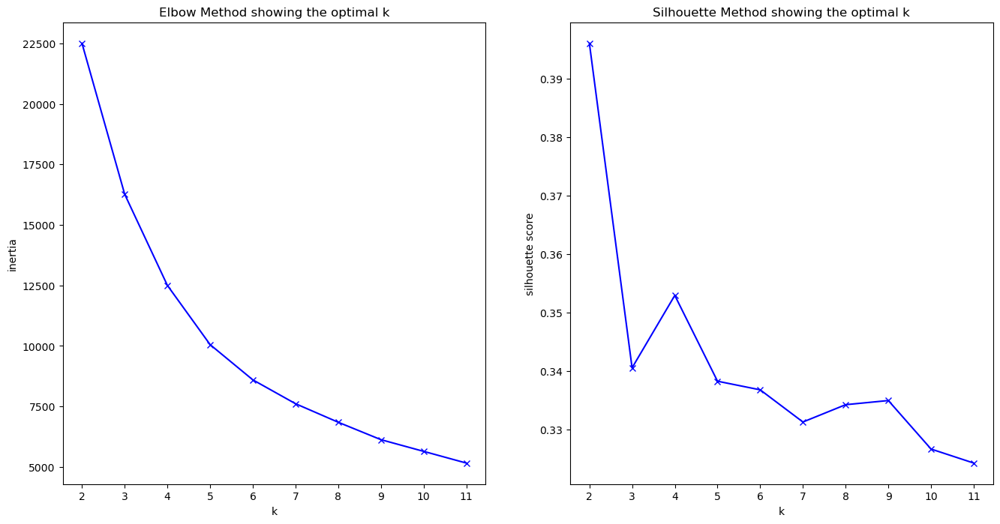

In [43]:
from sklearn.metrics import silhouette_score
K = range(2, 12)

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(scaled_df)
    
    path = '../models/'
    filename = "kmeans_w_transf_" + str(k) + ".pkl"
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(scaled_df, kmeans.predict(scaled_df)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [44]:
# elbow suggests something between 3-5
# silhouette shows only peak at k=2 and once going up at k=4

In [45]:
def load(filename = "filename.pkl"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [46]:
best_model = load("../models/kmeans_w_transf_3.pkl")

In [47]:
scaled_copy = scaled_df.copy()
scaled_copy['kmeans_3_cluster'] = best_model.predict(scaled_df)

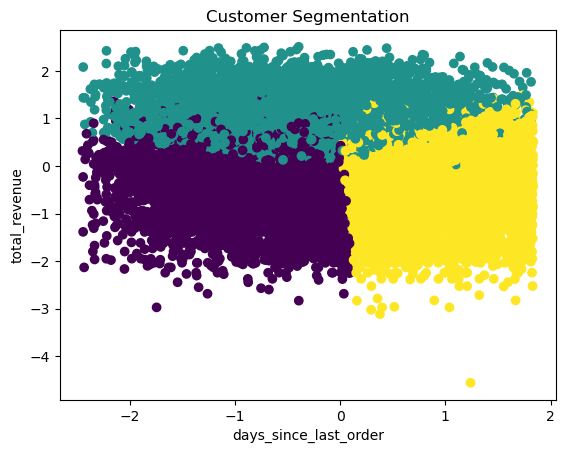

In [48]:
from sklearn.metrics import silhouette_score

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
plt.scatter(scaled_copy['recency'], scaled_copy['monetary'], c=scaled_copy['kmeans_3_cluster'], cmap='viridis')
plt.xlabel('days_since_last_order')
plt.ylabel('total_revenue')
plt.title('Customer Segmentation')
plt.show()

In [49]:
df['kmeans_cluster_n3'] = scaled_copy['kmeans_3_cluster']

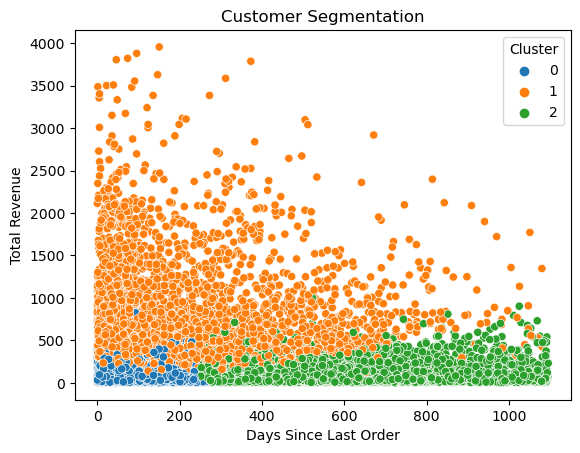

Silhouette Score: 0.4865333545699609
Calinski_harabasz Score: 12877.575761209298


In [50]:
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=df, hue='kmeans_cluster_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

In [51]:
df['kmeans_cluster_n3'] = df['kmeans_cluster_n3'].astype(str)

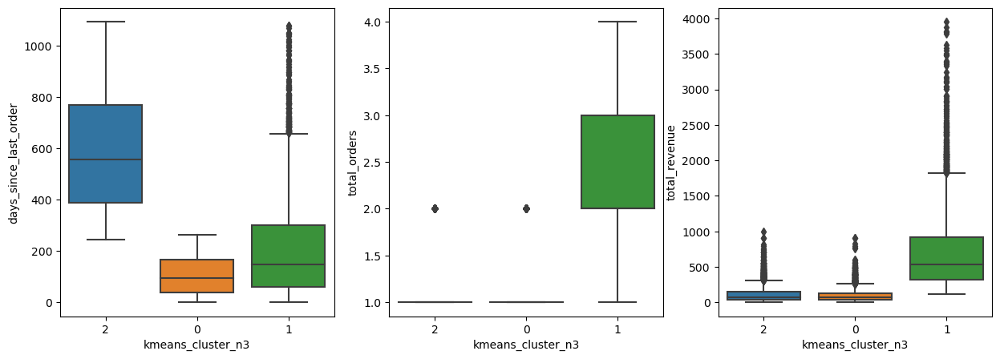

In [52]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=df, x='kmeans_cluster_n3', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_orders', ax=ax[1])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: no action in last year , one-time customers, low spendings
- Group 1: purchased recently, one-time customers, low spendings
- Group 2: purchased recently (but with long tail), recurring customer, middle spendings with upwards potential

## Clustering customers without RFM scoring model - Applying only Scaling

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/3027001458.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2).astype('str')


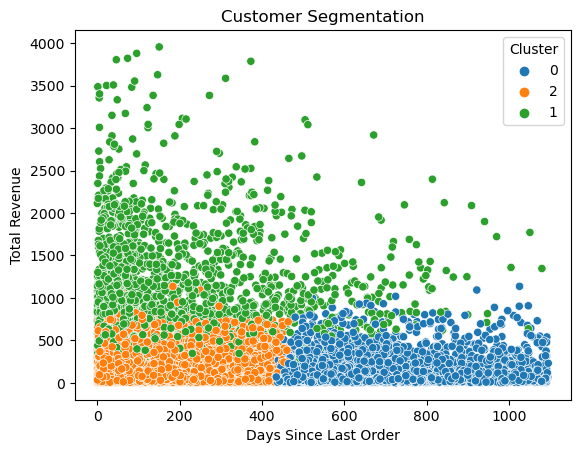

Silhouette Score: 0.4592046799592267
Calinski_harabasz Score: 12520.70978697559


In [53]:
X2 = df[['days_since_last_order', 'total_orders', 'total_revenue']]

scaler2 = StandardScaler()
scaler2.fit(X2)
X_scaled2 = scaler2.transform(X2)

path = "../scalers/.pkl"
filename = "scaler_before_not_transf.pkl" # Path with filename

with open(path+filename, "wb") as file:
    pickle.dump(scaler2,file)

X_scaled_df2 = pd.DataFrame(X_scaled2, columns = X2.columns)


kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled_df2)
X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2).astype('str')

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X2, hue='cluster_kmean', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(X_scaled_df2, kmeans.predict(X_scaled_df2))
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(X_scaled_df2, kmeans.predict(X_scaled_df2))
print(f"Calinski_harabasz Score: {calinski_harabasz}")

#### Silhouette Score:

Measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
Value ranges from -1 to 1. A higher silhouette score indicates better-defined clusters.

#### Calinski-Harabasz Index (Variance Ratio Criterion):
Measures the ratio of the between-cluster variance to the within-cluster variance. Higher values indicate better-defined clusters.

#### Conclusion
The Silhoette Score of 0.46 is still not great but among the models the best.

The Calinski-Harabasz score of 11,983 is also relatively high, indicating that the clusters in your KMeans model are well-separated. This is a positive result, suggesting that the chosen number of clusters and the resulting clustering configuration are effective in distinguishing between different groups in your data.

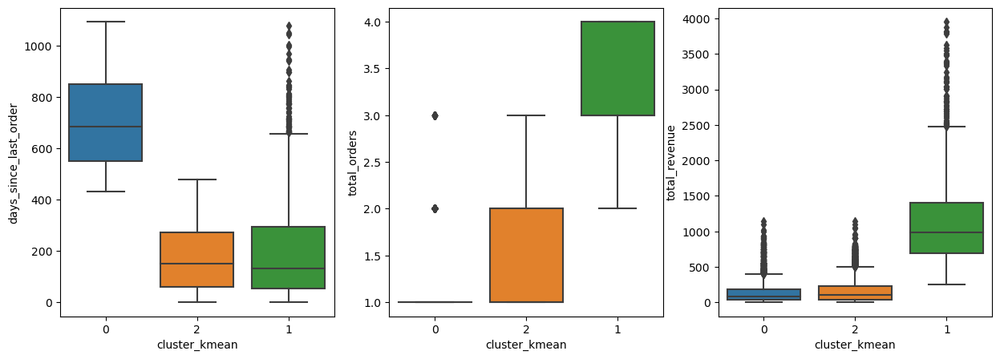

In [54]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=X2, x='cluster_kmean', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=X2, x='cluster_kmean', y='total_orders', ax=ax[1])
sns.boxplot(data=X2, x='cluster_kmean', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: hasn't purchased within last year, one time purchasers, low spendings
- Group 1: purchased in last year, mostly recurring customers, low spendings
- Group 2: purchased in last year(with long tail), frequent customers, middle spendings with some outliers

## DBSCAN for Clustering
For completion a DBSCAN is also performed and tested for clustering.

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_19329/3424976696.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['dbscan_cluster'] = dbscan.labels_


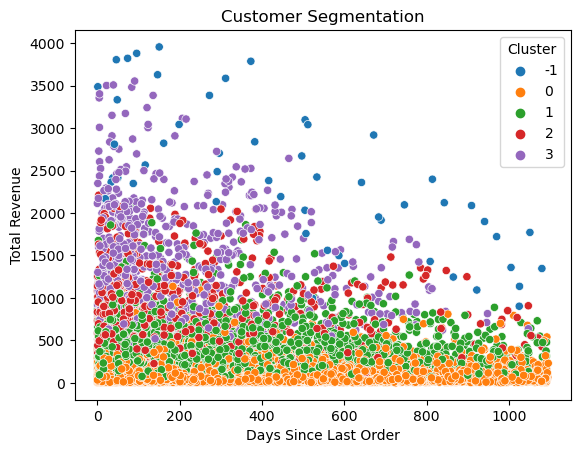

In [55]:
# Import library and create instance of model
from sklearn.cluster import DBSCAN

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
scaler = StandardScaler()
scaler.fit(X)
X_scaled_np = scaler.transform(X)
X_scaled_df = pd.DataFrame(X_scaled_np, columns=X.columns)

dbscan = DBSCAN(eps=0.5, min_samples=6)

# Fit the DBSCAN model to our data by calling the `fit` method
dbscan.fit_predict(X_scaled_df)

# Access the clusters allocate it to df
X['dbscan_cluster'] = dbscan.labels_

# Visualize the clusters
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X, hue='dbscan_cluster', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

In [56]:
# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(X_scaled_df, dbscan.fit_predict(X_scaled_df))
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(X_scaled_df, dbscan.fit_predict(X_scaled_df))
print(f"Calinski_harabasz Score: {calinski_harabasz}")

Silhouette Score: 0.3276608306862806
Calinski_harabasz Score: 4400.149055796182


In [57]:
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

neighbors = 6 # The value of MinPoints or mins_samples = 2 * number_of_columns
# X_embedded is your data
nbrs = NearestNeighbors(n_neighbors=neighbors).fit(X_scaled_df)
distances, indices = nbrs.kneighbors(X_scaled_df)
print("The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples", distances.shape)
distance_desc = sorted(distances[:,neighbors-1], reverse=True)
fig = px.line(x=list(range(1,len(distance_desc )+1)),y= distance_desc).update_layout(
    xaxis_title="Array index", yaxis_title="Distance"
)
fig.add_hline(y=0.5, annotation_text="Default value of epsilon in DBSCAN") #0.5 is always the default epsilon
fig.show()

The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples (13074, 6)


In [58]:
(min(distance_desc),max(distance_desc))

(0.002917825106035075, 1.6388637137657585)

In [59]:
from kneed import KneeLocator
kneedle = KneeLocator(range(1,len(distance_desc)+1),  #x values
                      distance_desc, # y values
                      S=1.0, #parameter suggested from paper
                      curve="convex", #parameter from figure (see https://mmerevise.co.uk/a-level-maths-revision/convex-and-concave-curves/)
                      direction="decreasing") #parameter from figure
print("The epsilon value for which the distance plot has the biggest change in the slope is: {:.2f}".format(kneedle.knee_y))

The epsilon value for which the distance plot has the biggest change in the slope is: 0.42


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



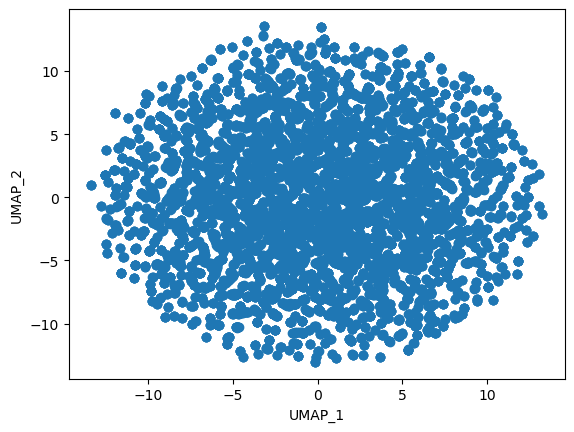

In [60]:
from umap import UMAP

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
reducer = UMAP(n_neighbors=3, n_components=2,random_state=42)
reducer.fit(X)

X_umap_transformed = reducer.transform(X)
X_umap_transformed_df = pd.DataFrame(X_umap_transformed, columns=["UMAP_1","UMAP_2"])

fig, ax = plt.subplots()
ax.scatter(X_umap_transformed_df['UMAP_1'],X_umap_transformed_df['UMAP_2'])
ax.set_xlabel("UMAP_1")
ax.set_ylabel("UMAP_2")
plt.show()

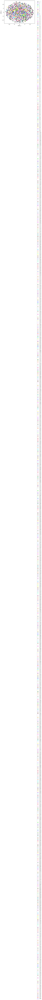

In [61]:
import colorcet as cc

dbscan = DBSCAN(eps=0.2)

# Fit the DBSCAN model to our data by calling the `fit` method
yhat = dbscan.fit_predict(X_umap_transformed_df)

# Access the clusters allocate it to df
X_umap_transformed_df['dbscan_cluster'] = yhat

# retrieve unique clusters
cluster_dbscan = np.unique(yhat)

# Visualize the clusters
# Creating a pallette of hihg contrast colors with as many color as cluster labels
custom_palette = sns.color_palette(cc.glasbey, n_colors=cluster_dbscan.size)
# Modifiying the palette to set the color "black=(0.,0.,0.)" to the label "-1" #(R,G,B)
custom_palette = [color if cluster_dbscan != -1 else (0.,0.,0.) for cluster_dbscan, color in zip(cluster_dbscan,custom_palette)]
sns.scatterplot(X_umap_transformed_df, x="UMAP_1", y="UMAP_2", hue="dbscan_cluster", palette=custom_palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()

In [62]:
print("The Silhouette score of the model is: ",round(silhouette_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))
print("The Calinksi-Harabasz score of the model is: ",round(calinski_harabasz_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))

The Silhouette score of the model is:  0.85
The Calinksi-Harabasz score of the model is:  107233.06


The scores are good but the clustering overfits. There are way too many clusters.
Therefore, the KMeans Clustering without transforming the variables before looks still the best.

In [63]:
# Adding the clusters to the original df:
df['kmeans_cluster_wo_transf'] = X2["cluster_kmean"] # aka the best model

# For later checks (in the model creation), also the other models are added:
df.rename(columns={'kmeans_cluster_n3': 'kmeans_cluster_w_transf'}, inplace=True)
#df['kmeans_cluster_w_transf'] = scaled_copy["kmeans_3_cluster"] 
df['kmeans_rfm_score_based'] = rfm_copy['kmeans_total_scores_n3']

## Comparing all Segmentation Models in 3D
Summing it up and coming to a conclusion, let's have a look at the 3D Model of the three clusters (without DBSCAN)

In [64]:
# This segmentation looks the best:days_since_last_order
fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_cluster_wo_transf')
fig.show()

In [65]:
df['kmeans_cluster_w_transf'] = df['kmeans_cluster_w_transf'].astype('str')

fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_cluster_w_transf')
fig.show()

In [66]:
df['kmeans_rfm_score_based'] = df['kmeans_rfm_score_based'].astype('str')
fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_rfm_score_based')
fig.show()

## Summary

The segmenation model that doesn't transform the variables upfront works best with a silhouette score of 0.46 and a  Calinski-Harabasz score of 11,983.
RFM scoring can be skipped as only applying the K-means to the variables (that areequivalent to RFM) is sufficient.
The segmentation result is not perfect but is able to put the customers into three general buckets.

I suggest to iterate through other options:
- leaving out the factor frequency as the max amount per customers is only 4
- group frequency to 0, 1: for one-time-purchasers & more frequent purchasers
- include days_since_registration as tenure and include it in the model
- try clustering with other variables and not only RFM features
    - tested already and doesn't give good insights

In [67]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,days_since_first_order,days_since_last_order,days_since_registration,days_until_first_order,age_class,registration_year,registration_month,kmeans_cluster_w_transf,kmeans_cluster_wo_transf,kmeans_rfm_score_based
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,949.572917,949.572917,1291.572917,342.0,31-40,2020,6,2,0,1
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,32.695833,32.695833,100.695833,68.0,19-30,2023,9,0,2,0
2,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,133.884722,133.884722,264.884722,131.0,61-70,2023,4,0,2,0
3,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,174.426389,95.426389,244.426389,70.0,0-18,2023,5,1,2,2
4,51,2019-07-11 00:19:00+00:00,66,M,Siegen,Germany,2021-08-15 00:19:00+00:00,2021-08-15 00:19:00+00:00,1,1.0,...,868.986806,868.986806,1634.986806,766.0,61-70,2019,7,2,0,1


In [68]:
df.to_csv('../data/cleaned/customer_information_with_segments.csv', index=False)

##### functions

In [69]:
def customer_clusters(df: pd.DataFrame, recency= 'recency', frequency= 'frequency', monetary= 'monetary', k= 3):
    """
    Input data frame with RFM-alike columns that will be used for clustering.
    Function scales variables and performs a KMeans Clustering with k=3 default.
    Returns df with appended Kmeans Clusters.
    """

    X = df[[recency, frequency, monetary]]

    scaler = StandardScaler()
    scaler.fit(X)
    X_scaled = scaler.transform(X)

    X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)


    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    X["cluster_kmean"]  = kmeans.predict(X_scaled_df)

    return X